In [1]:
# 0. Import

import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as pl
from scipy.stats import mode
from collections import Counter

In [5]:
# visualization settings

sc.settings.verbosity = 3
sc.set_figure_params(color_map='viridis')
sc.logging.print_versions()

-----
anndata     0.9.1
scanpy      1.9.3
-----
PIL                 9.5.0
anyio               NA
arrow               1.2.3
asttokens           NA
attr                23.1.0
babel               2.12.1
backcall            0.2.0
certifi             2023.05.07
cffi                1.15.1
charset_normalizer  3.1.0
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
defusedxml          0.7.1
executing           1.2.0
fastjsonschema      NA
fqdn                NA
h5py                3.8.0
idna                3.4
igraph              0.10.4
importlib_resources NA
ipykernel           6.22.0
isoduration         NA
jedi                0.18.2
jinja2              3.1.2
joblib              1.2.0
json5               NA
jsonpointer         2.4
jsonschema          4.17.3
jupyter_events      0.6.3
jupyter_server      2.7.0
jupyterlab_server   2.23.0
kiwisolver          1.4.4
leid

## 1. Read in preprocessed data

In [6]:
adata = sc.read('scanpy_processed_matrix_both_no_cc.h5ad')
adata.var_names_make_unique()

We don't actually need the scaled counts. Let's save some disk space and memory and set it to `None`.

In [7]:
adata.X = None

Instead add the raw counts for visualization.

In [8]:
adata_raw = sc.read('scanpy_filtered_all_genes_matrix_both.h5ad')
adata_raw.var_names_make_unique()
sc.pp.log1p(adata_raw)
adata.raw = adata_raw

print(adata)
print(adata.raw.X.shape)

AnnData object with n_obs × n_vars = 44802 × 4665
    obs: 'sample', 'exp_groups', 'percent_mito', 'n_counts', 'n_counts_log', 'n_genes', 'erythroid_cc_group', 'gephi_1', 'gephi_2'
    var: 'ensembl_ids', 'n_cells', 'mean', 'std'
    uns: 'diffmap_evals', 'exp_groups_colors', 'log1p', 'neighbors', 'pca'
    obsm: 'X_diffmap', 'X_pca'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
(44802, 27998)


## 2. Clustering

In [9]:
sc.pp.neighbors(adata, n_neighbors=7, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20


c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:44)


In [10]:
sc.tl.louvain(adata)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 23 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:05)


## 3. tSNE fitting

In [11]:
sc.tl.tsne(adata, perplexity=25, n_pcs = 20)

computing tSNE
    using 'X_pca' with n_pcs = 20
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:05:43)


In [12]:
print(adata)

AnnData object with n_obs × n_vars = 44802 × 4665
    obs: 'sample', 'exp_groups', 'percent_mito', 'n_counts', 'n_counts_log', 'n_genes', 'erythroid_cc_group', 'gephi_1', 'gephi_2', 'louvain'
    var: 'ensembl_ids', 'n_cells', 'mean', 'std'
    uns: 'diffmap_evals', 'exp_groups_colors', 'log1p', 'neighbors', 'pca', 'louvain', 'tsne'
    obsm: 'X_diffmap', 'X_pca', 'X_tsne'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


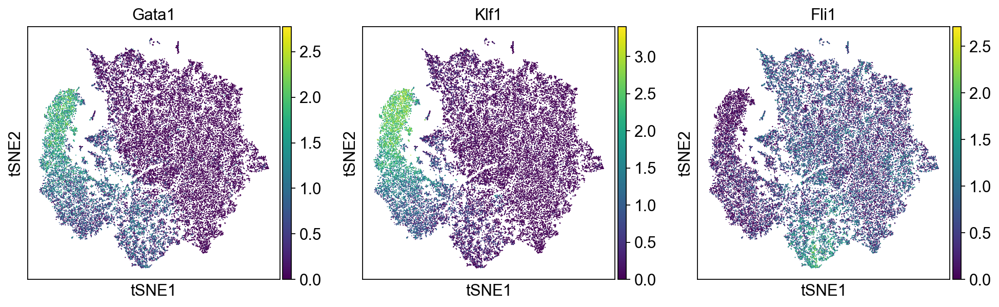

In [13]:
sc.pl.tsne(adata, color=['Gata1', 'Klf1', 'Fli1'], legend_loc='on data')

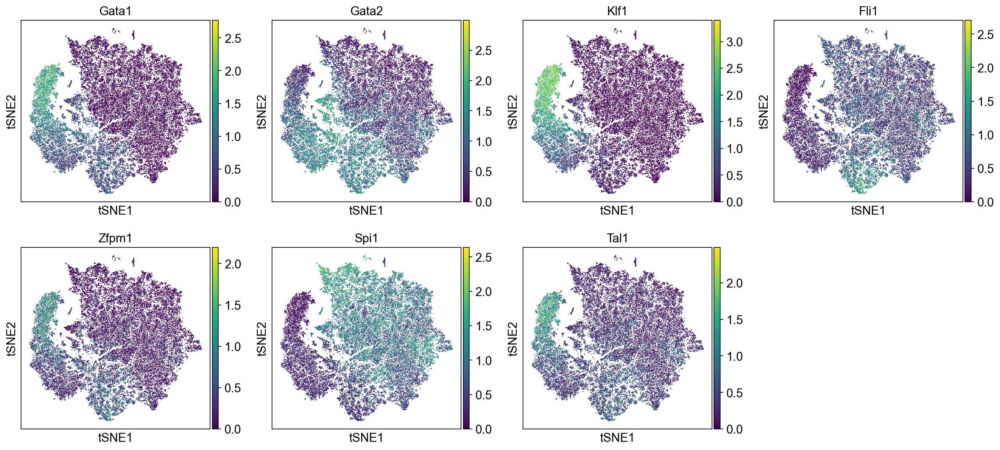

In [14]:
sc.pl.tsne(adata, color=['Gata1', 'Gata2', 'Klf1', 'Fli1', 'Zfpm1', 'Spi1', 'Tal1'], legend_loc='on data')

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


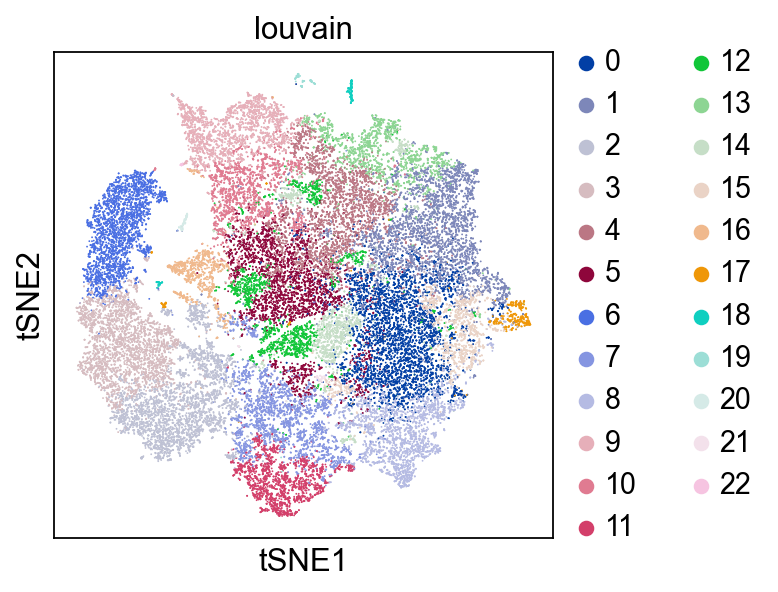

In [18]:
# Plot the t-SNE visualization
sc.pl.tsne(adata, color='louvain')

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


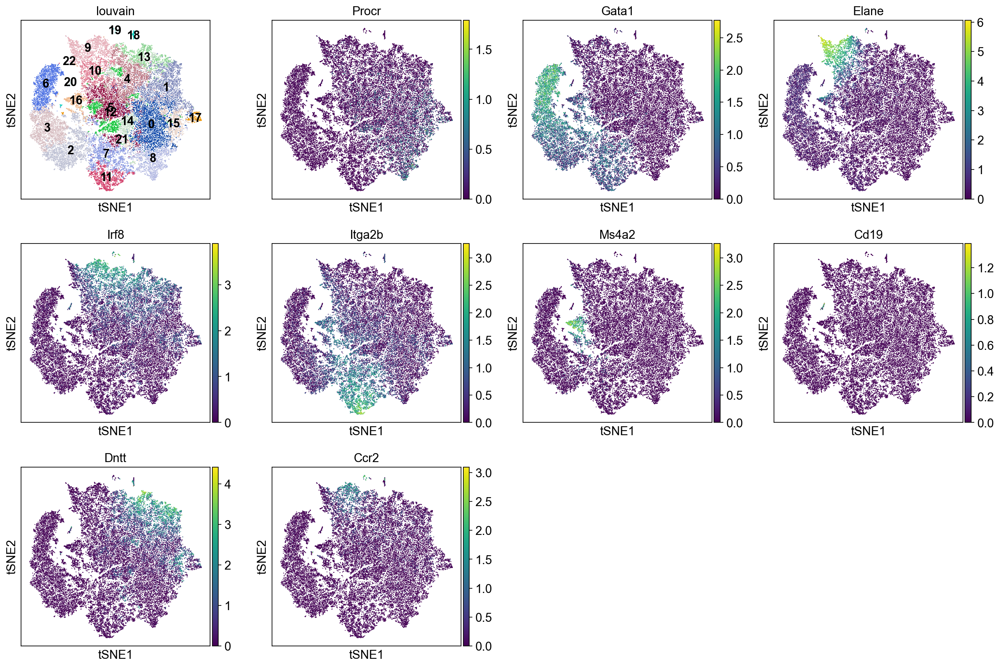

In [23]:
sc.pl.tsne(adata, color=['louvain', 'Procr', 'Gata1', 'Elane', 'Irf8','Itga2b', 'Ms4a2', 'Cd19', 'Dntt', 'Ccr2'], legend_loc='on data')

In [24]:
# Make cluster anottation dictionary
annotation = {"HSCs":[8],
              "Erythroids": [2,3,6],
              "Megakaryocytes":[11], 
              "Bas/Mas":[16],
              "Gran/Mono":[9],
              "." :[0,1,4,5,7,10,12,13,14,15,17,18,19,20,21,22, 23]}

# Change dictionary format
annotation_rev = {}
for i in cluster_list:
    for k in annotation:
        if int(i) in annotation[k]:
            annotation_rev[i] = k
            
# Check dictionary
annotation_rev

{'8': 'HSCs',
 '15': '.',
 '7': '.',
 '11': 'Megakaryocytes',
 '4': '.',
 '5': '.',
 '18': '.',
 '0': '.',
 '9': 'Gran/Mono',
 '14': '.',
 '13': '.',
 '2': 'Erythroids',
 '1': '.',
 '12': '.',
 '3': 'Erythroids',
 '17': '.',
 '16': 'Bas/Mas',
 '10': '.',
 '6': 'Erythroids',
 '20': '.',
 '21': '.',
 '19': '.',
 '22': '.'}

In [25]:
adata.obs["cell_type"] = [annotation_rev[i] for i in adata.obs.louvain]

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


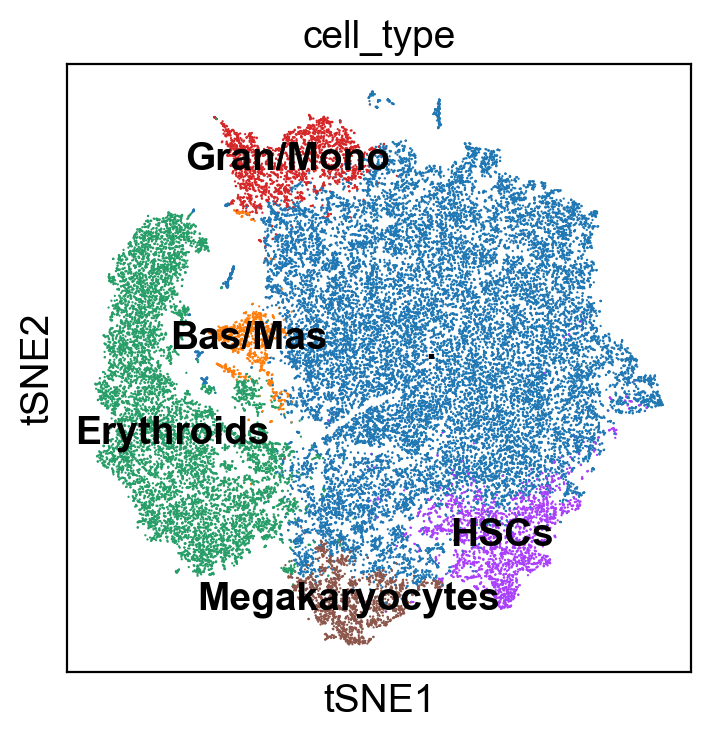

In [27]:
sc.pl.tsne(adata, color=['cell_type'], legend_loc='on data')

## 4. Export data

In [29]:
!mkdir write_fig3

# Check current cluster name
cluster_list = adata.obs.louvain.unique()
cluster_list

['8', '15', '7', '11', '4', ..., '6', '20', '21', '19', '22']
Length: 23
Categories (23, object): ['0', '1', '2', '3', ..., '19', '20', '21', '22']

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


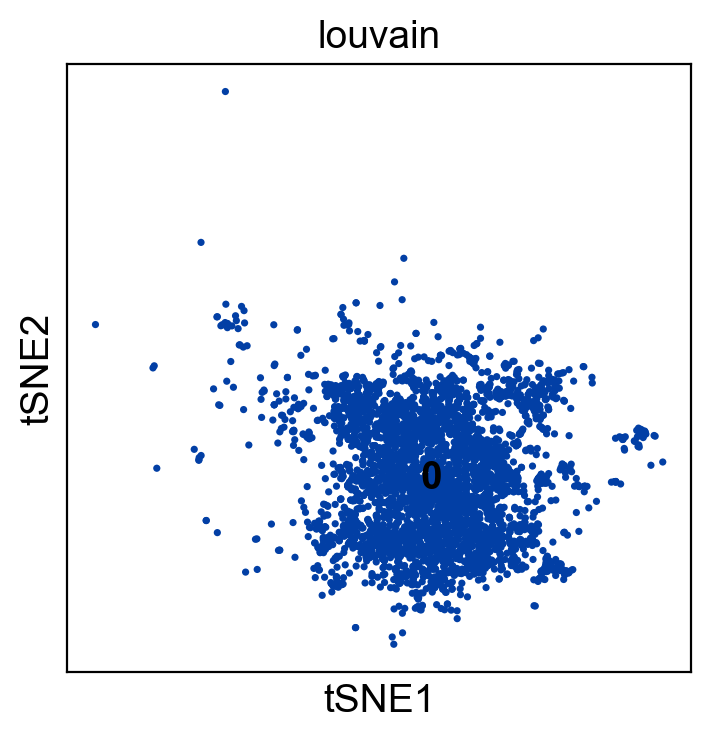

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(4462,)
Index(['AAACCTGCATCCTTGC-1_SIGAB1', 'AAACCTGCATGCAATC-1_SIGAB1',
       'AAACGGGCAACGCACC-1_SIGAB1', 'AAACGGGCAAGCCGTC-1_SIGAB1',
       'AAACGGGGTATGCTTG-1_SIGAB1', 'AAACGGGTCTTAGCCC-1_SIGAB1',
       'AAAGATGAGCTGATAA-1_SIGAB1', 'AAAGATGCAGACGTAG-1_SIGAB1',
       'AAAGATGTCTCCAGGG-1_SIGAB1', 'AAAGCAACAACTGCTA-1_SIGAB1',
       ...
       'TGTGGTAAGGCAGTCA-1_SIGAH1', 'TTAGGACGTAAGTAGT-1_SIGAH1',
       'TTATGCTCACGCGAAA-1_SIGAH1', 'TTATGCTGTATAATGG-1_SIGAH1',
       'TTATGCTTCACATACG-1_SIGAH1', 'TTCGAAGAGGAACTGC-1_SIGAH1',
       'TTCTTAGAGACTTGAA-1_SIGAH1', 'TTGCGTCCACAACGCC-1_SIGAH1',
       'TTGCGTCCACGTTGGC-1_SIGAH1', 'TTGCGTCTCAAGAAGT-1_SIGAH1'],
      dtype='object', length=4462)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


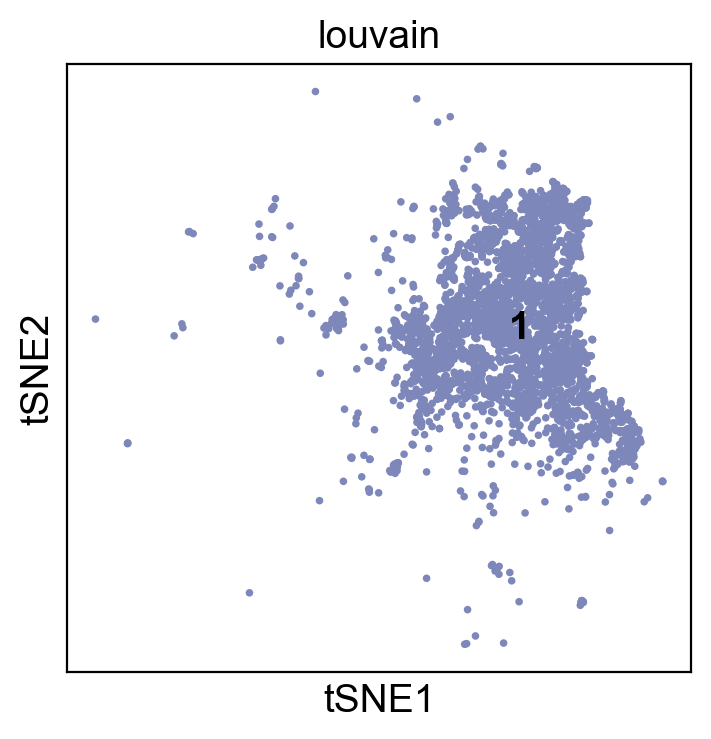

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(4006,)
Index(['AAAGATGAGAGGTAGA-1_SIGAB1', 'AAAGATGCACATCTTT-1_SIGAB1',
       'AAAGATGTCCGTAGGC-1_SIGAB1', 'AAAGCAAAGCCACGCT-1_SIGAB1',
       'AAAGCAAAGCGATATA-1_SIGAB1', 'AAAGCAACACCAACCG-1_SIGAB1',
       'AAAGTAGCAATAAGCA-1_SIGAB1', 'AAAGTAGCAATAGCGG-1_SIGAB1',
       'AAAGTAGCACCGCTAG-1_SIGAB1', 'AAATGCCCAAACGTGG-1_SIGAB1',
       ...
       'TTCTCCTGTCATGCCG-1_SIGAH1', 'TTGAACGAGAGGTTGC-1_SIGAH1',
       'TTGAACGGTACTTCTT-1_SIGAH1', 'TTGGAACGTAAACCTC-1_SIGAH1',
       'TTGGCAATCCAGAAGG-1_SIGAH1', 'TTGTAGGAGTGTACTC-1_SIGAH1',
       'TTTGCGCGTGTTAAGA-1_SIGAH1', 'TTTGCGCTCAGGTTCA-1_SIGAH1',
       'TTTGTCAAGGATGGTC-1_SIGAH1', 'TTTGTCATCCTCAATT-1_SIGAH1'],
      dtype='object', length=4006)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


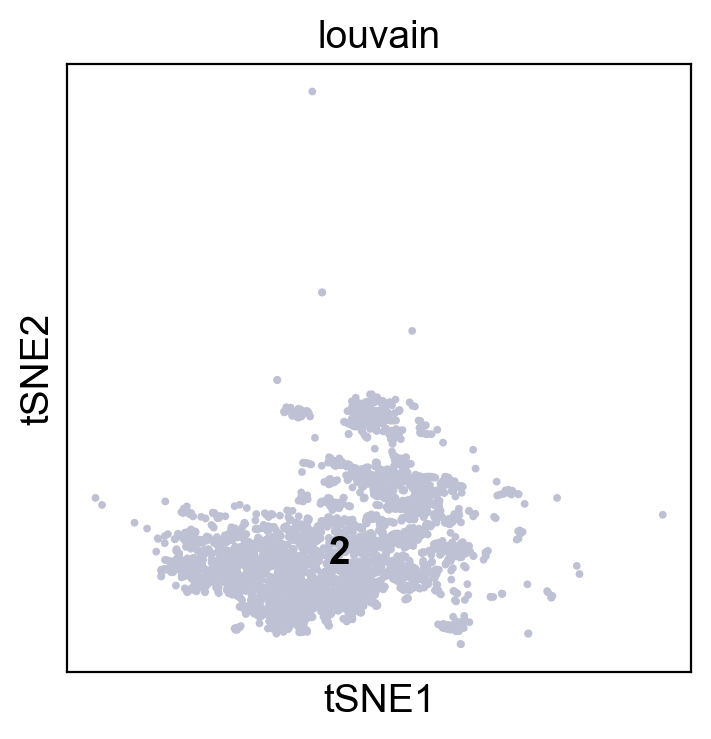

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(3809,)
Index(['AAAGATGAGACGCTTT-1_SIGAB1', 'AACACGTGTGGTGTAG-1_SIGAB1',
       'AACTCCCCAGCTGTAT-1_SIGAB1', 'AACTCTTGTTCACGGC-1_SIGAB1',
       'ACACCCTGTTACCGAT-1_SIGAB1', 'ACGATGTTCTGCCAGG-1_SIGAB1',
       'ACGGCCACAGAGTGTG-1_SIGAB1', 'ACTGAACAGCTGTCTA-1_SIGAB1',
       'ACTGAGTCAAATTGCC-1_SIGAB1', 'ACTTACTAGACGCACA-1_SIGAB1',
       ...
       'TTTACTGTCTACTATC-1_SIGAH1', 'TTTCCTCTCCAAGCCG-1_SIGAH1',
       'TTTGCGCAGTCCAGGA-1_SIGAH1', 'TTTGGTTAGGACATTA-1_SIGAH1',
       'TTTGGTTCATAAAGGT-1_SIGAH1', 'TTTGGTTGTCACCTAA-1_SIGAH1',
       'TTTGGTTTCTTGCCGT-1_SIGAH1', 'TTTGTCAAGCACCGTC-1_SIGAH1',
       'TTTGTCAAGCACGCCT-1_SIGAH1', 'TTTGTCAAGTATTGGA-1_SIGAH1'],
      dtype='object', length=3809)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


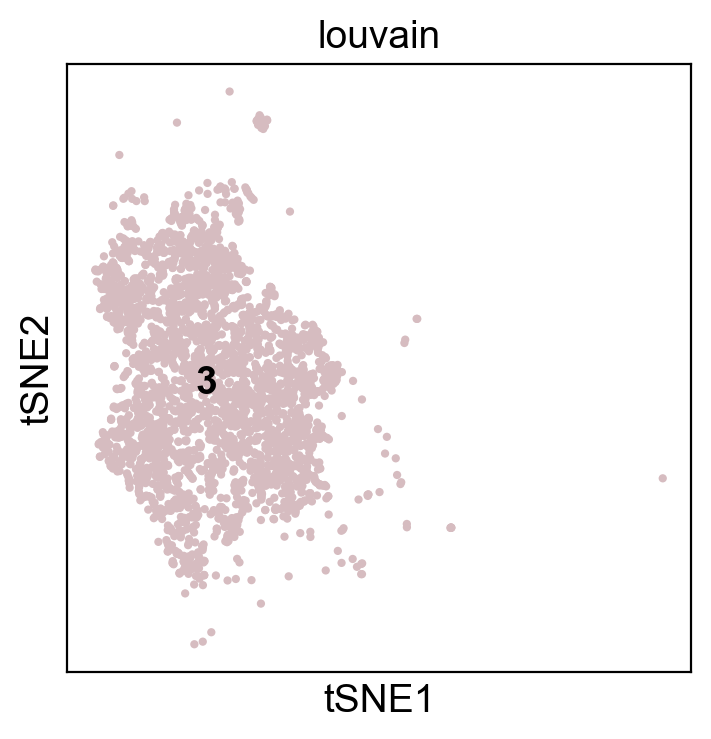

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(3394,)
Index(['AAAGTAGGTTATCCGA-1_SIGAB1', 'AACGTTGCAAATTGCC-1_SIGAB1',
       'AATCCAGGTTACCAGT-1_SIGAB1', 'ACAGCCGGTGCCTGTG-1_SIGAB1',
       'ACCGTAACACGCGAAA-1_SIGAB1', 'ACGCCGAGTCTTCGTC-1_SIGAB1',
       'ACTGCTCAGAAGGTGA-1_SIGAB1', 'AGAATAGCACATCCAA-1_SIGAB1',
       'AGCATACAGGTGTGGT-1_SIGAB1', 'AGCCTAACAGTATGCT-1_SIGAB1',
       ...
       'TTTATGCTCAGAAATG-1_SIGAH1', 'TTTGCGCAGGTACTCT-1_SIGAH1',
       'TTTGCGCCAACGATGG-1_SIGAH1', 'TTTGCGCTCGCCAGCA-1_SIGAH1',
       'TTTGGTTAGGGTGTTG-1_SIGAH1', 'TTTGGTTTCGAATCCA-1_SIGAH1',
       'TTTGGTTTCTGGTGTA-1_SIGAH1', 'TTTGTCAAGAAACGAG-1_SIGAH1',
       'TTTGTCAAGGCTCATT-1_SIGAH1', 'TTTGTCACAGACGCAA-1_SIGAH1'],
      dtype='object', length=3394)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


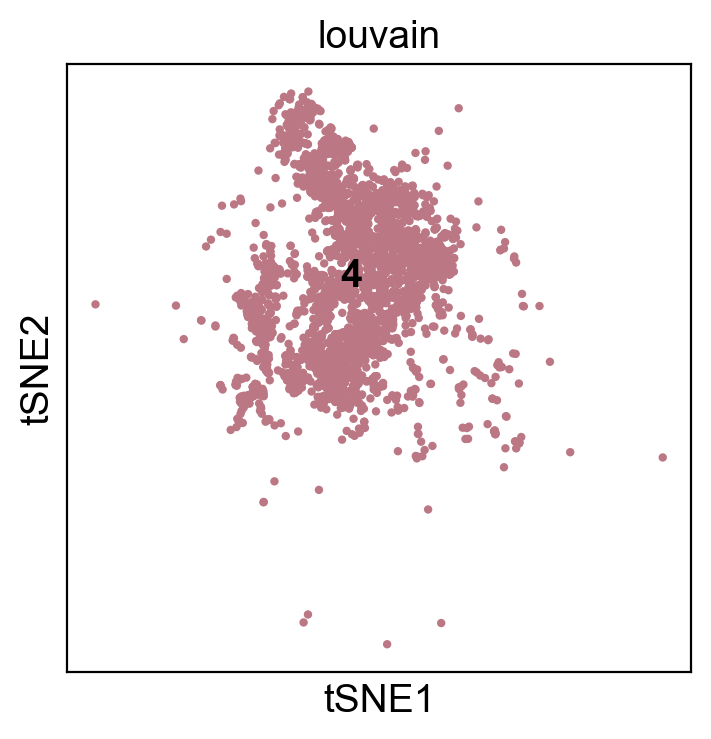

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(3286,)
Index(['AAACCTGAGGCTATCT-1_SIGAB1', 'AAACCTGCAATACGCT-1_SIGAB1',
       'AAAGATGAGACGCAAC-1_SIGAB1', 'AAAGCAACACTTCGAA-1_SIGAB1',
       'AAAGCAAGTCCGTCAG-1_SIGAB1', 'AAAGCAAGTCGCGAAA-1_SIGAB1',
       'AAAGCAAGTGTCGCTG-1_SIGAB1', 'AAATGCCGTAGCTGCC-1_SIGAB1',
       'AAATGCCGTCTGCGGT-1_SIGAB1', 'AAATGCCTCTGAAAGA-1_SIGAB1',
       ...
       'TGTGGTATCTATGTGG-1_SIGAH1', 'TTAGGCATCAACGAAA-1_SIGAH1',
       'TTGAACGAGAGACGAA-1_SIGAH1', 'TTGAACGTCTGTGCAA-1_SIGAH1',
       'TTGGAACAGGCAGTCA-1_SIGAH1', 'TTGGAACCACGCCAGT-1_SIGAH1',
       'TTGGCAAAGCCGCCTA-1_SIGAH1', 'TTTATGCTCAGGTTCA-1_SIGAH1',
       'TTTCCTCCATGTCCTC-1_SIGAH1', 'TTTGCGCTCGTGACAT-1_SIGAH1'],
      dtype='object', length=3286)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


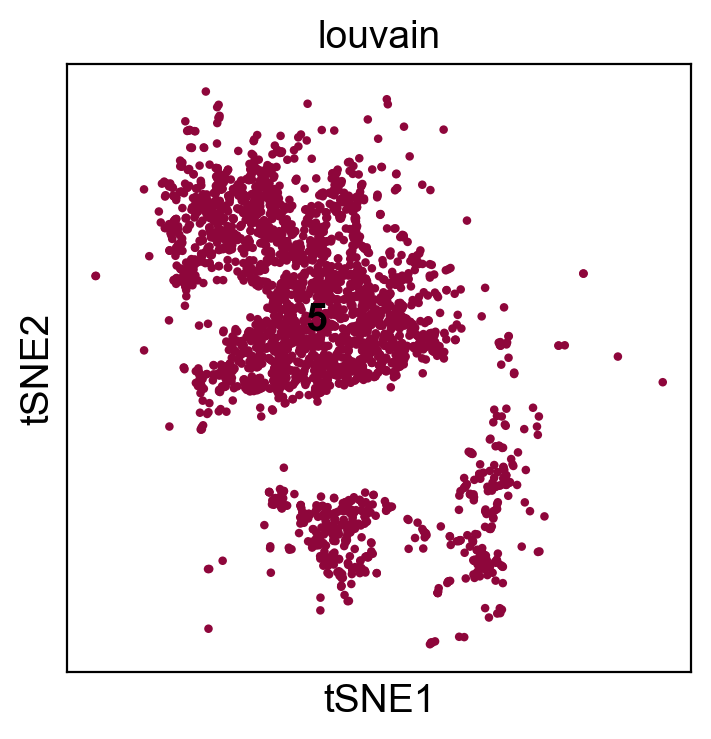

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(3162,)
Index(['AAACCTGAGTTATCGC-1_SIGAB1', 'AAAGATGGTACACCGC-1_SIGAB1',
       'AAAGATGTCTTGACGA-1_SIGAB1', 'AAAGCAAAGAACTGTA-1_SIGAB1',
       'AAAGCAATCAGGCGAA-1_SIGAB1', 'AAAGTAGCAGGTCTCG-1_SIGAB1',
       'AAATGCCAGGCTAGAC-1_SIGAB1', 'AAATGCCGTGTGCGTC-1_SIGAB1',
       'AAATGCCTCCACTCCA-1_SIGAB1', 'AAATGCCTCTCATTCA-1_SIGAB1',
       ...
       'TTCTCAAGTCGCCATG-1_SIGAH1', 'TTCTCAATCGCCTGAG-1_SIGAH1',
       'TTCTCAATCGTCCAGG-1_SIGAH1', 'TTCTCCTGTGAGCGAT-1_SIGAH1',
       'TTCTCCTTCGGAAACG-1_SIGAH1', 'TTCTTAGTCCTTAATC-1_SIGAH1',
       'TTGAACGCACCATCCT-1_SIGAH1', 'TTGCGTCTCGGTCCGA-1_SIGAH1',
       'TTGGCAACATGACATC-1_SIGAH1', 'TTTATGCTCTGGCGTG-1_SIGAH1'],
      dtype='object', length=3162)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


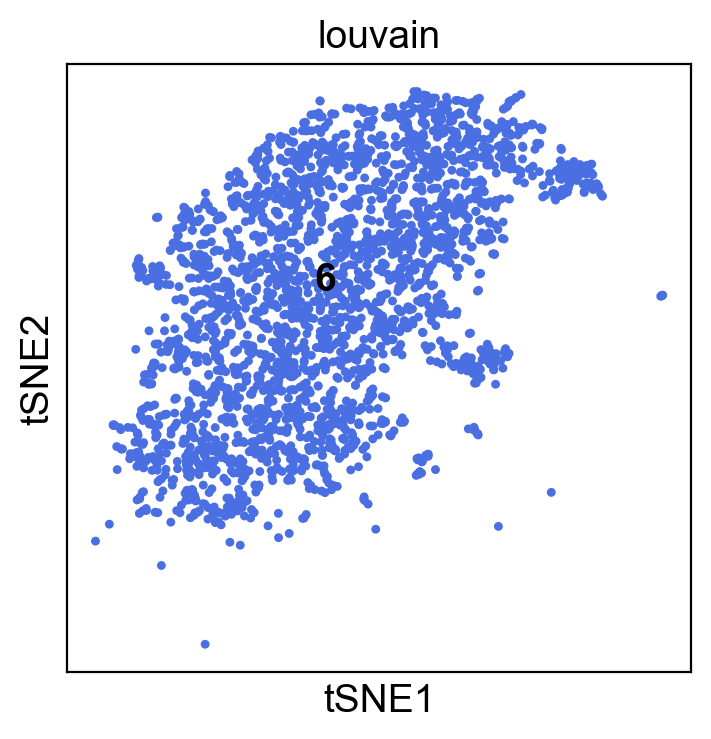

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(2937,)
Index(['AACGTTGCACGACGAA-1_SIGAB1', 'ACGAGCCCACTGTGTA-1_SIGAB1',
       'AGCTCCTGTCTGCGGT-1_SIGAB1', 'AGGCCGTTCAGCATGT-1_SIGAB1',
       'ATGCGATTCAGCTTAG-1_SIGAB1', 'CATGACACAACTTGAC-1_SIGAB1',
       'CCGTACTTCGTCGTTC-1_SIGAB1', 'CCTCAGTTCCACTGGG-1_SIGAB1',
       'CTACATTTCTTACCGC-1_SIGAB1', 'CTCGTCAAGGCCCTTG-1_SIGAB1',
       ...
       'TTTACTGAGGCTAGGT-1_SIGAH1', 'TTTACTGGTATTCTCT-1_SIGAH1',
       'TTTATGCAGAATGTGT-1_SIGAH1', 'TTTATGCAGCCGGTAA-1_SIGAH1',
       'TTTATGCCATAGACTC-1_SIGAH1', 'TTTATGCGTGGTCCGT-1_SIGAH1',
       'TTTCCTCCATGTAGTC-1_SIGAH1', 'TTTCCTCTCCAGTATG-1_SIGAH1',
       'TTTGGTTGTAAATACG-1_SIGAH1', 'TTTGTCAAGCAGACTG-1_SIGAH1'],
      dtype='object', length=2937)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


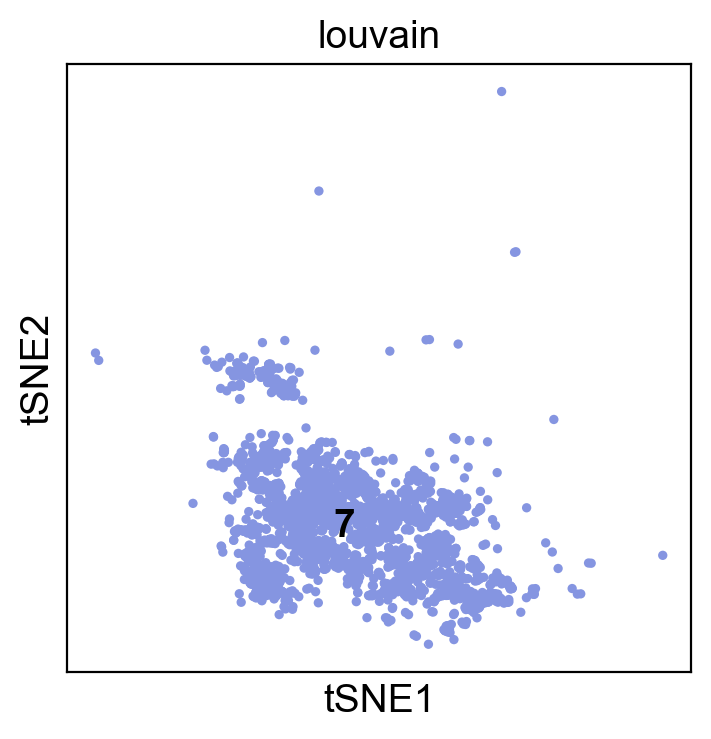

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(2668,)
Index(['AAACCTGAGATGGGTC-1_SIGAB1', 'AAACCTGTCTCAAGTG-1_SIGAB1',
       'AAACGGGCAGCTTCGG-1_SIGAB1', 'AAAGCAAAGGCTAGGT-1_SIGAB1',
       'AAATGCCAGACTAGGC-1_SIGAB1', 'AACCGCGTCTCTTGAT-1_SIGAB1',
       'AACGTTGGTTCAGCGC-1_SIGAB1', 'AACTCAGAGCGCCTCA-1_SIGAB1',
       'AACTCAGGTAATAGCA-1_SIGAB1', 'AACTCAGGTGACCAAG-1_SIGAB1',
       ...
       'TTCTACATCGTCACGG-1_SIGAH1', 'TTCTCAACAGTTCATG-1_SIGAH1',
       'TTCTTAGAGTTCGCGC-1_SIGAH1', 'TTGAACGTCCGAGCCA-1_SIGAH1',
       'TTGAACGTCCTAGTGA-1_SIGAH1', 'TTGCGTCTCAGTTTGG-1_SIGAH1',
       'TTGGAACTCTGCAAGT-1_SIGAH1', 'TTGTAGGGTCGCGGTT-1_SIGAH1',
       'TTGTAGGTCCCTTGTG-1_SIGAH1', 'TTTACTGGTTCGGCAC-1_SIGAH1'],
      dtype='object', length=2668)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


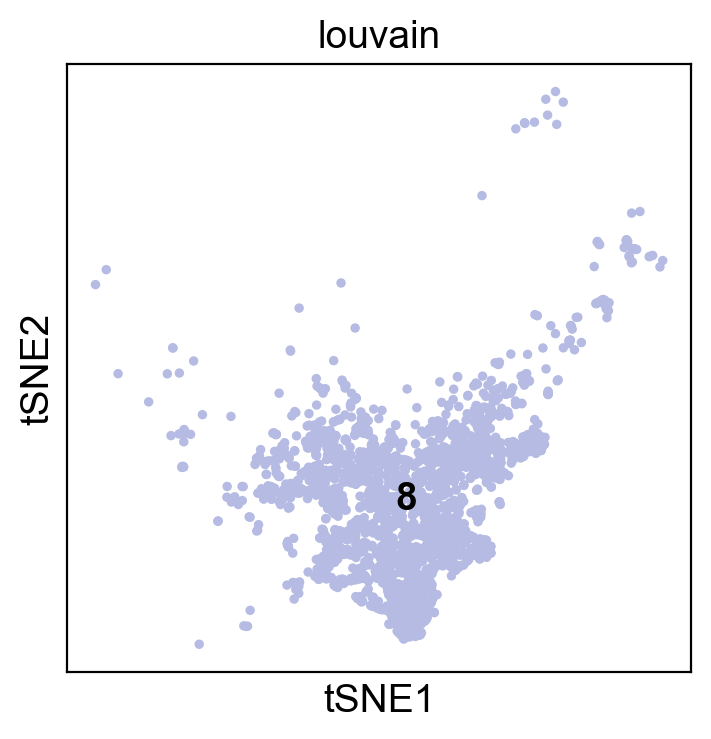

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(2591,)
Index(['AAACCTGAGACAAAGG-1_SIGAB1', 'AAACCTGCAATAGCGG-1_SIGAB1',
       'AAACCTGCACATGGGA-1_SIGAB1', 'AAACCTGTCTTATCTG-1_SIGAB1',
       'AAACGGGCACCCAGTG-1_SIGAB1', 'AAAGATGCAGACAAGC-1_SIGAB1',
       'AAAGATGGTTGTTTGG-1_SIGAB1', 'AAAGCAAAGCTCTCGG-1_SIGAB1',
       'AAAGTAGGTTCCACTC-1_SIGAB1', 'AACACGTTCAGTGTTG-1_SIGAB1',
       ...
       'TTAACTCGTATCACCA-1_SIGAH1', 'TTCCCAGAGATCGATA-1_SIGAH1',
       'TTCTCAAAGTTCGCGC-1_SIGAH1', 'TTCTCAACAGCTCGCA-1_SIGAH1',
       'TTGACTTCAAGTTGTC-1_SIGAH1', 'TTTACTGAGGGTGTGT-1_SIGAH1',
       'TTTACTGCAAAGTCAA-1_SIGAH1', 'TTTACTGTCACAATGC-1_SIGAH1',
       'TTTATGCCAACGCACC-1_SIGAH1', 'TTTCCTCGTGTAAGTA-1_SIGAH1'],
      dtype='object', length=2591)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


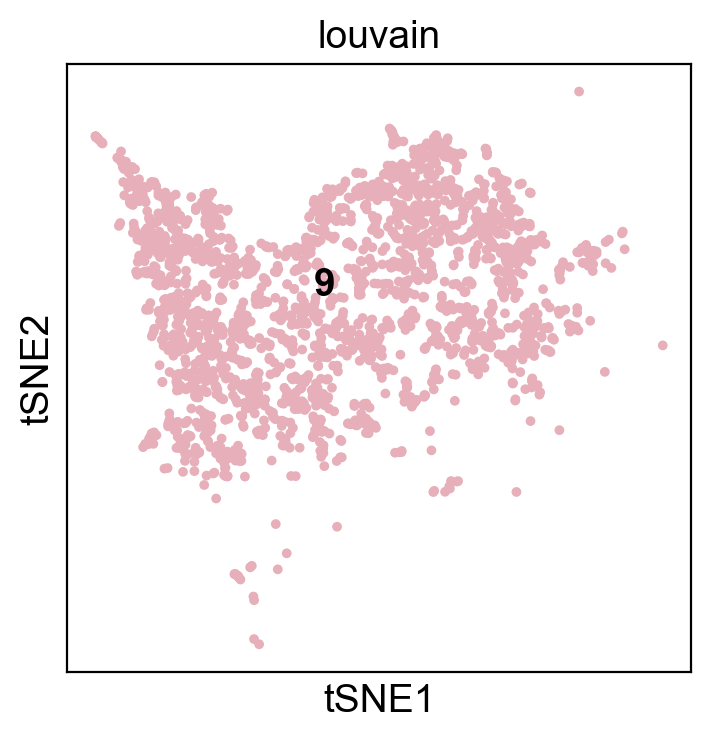

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(2435,)
Index(['AAACCTGTCTGCTGTC-1_SIGAB1', 'AACACGTAGCTGATAA-1_SIGAB1',
       'AACTGGTGTCAATACC-1_SIGAB1', 'AACTTTCCATTACCTT-1_SIGAB1',
       'AATCCAGAGCCATCGC-1_SIGAB1', 'ACATCAGCATGTTGAC-1_SIGAB1',
       'ACATGGTAGTACGTAA-1_SIGAB1', 'ACGATACCATGTCGAT-1_SIGAB1',
       'ACGCCGAAGGCTCAGA-1_SIGAB1', 'ACTTACTCAAACCCAT-1_SIGAB1',
       ...
       'TTGGAACCATGTCGAT-1_SIGAH1', 'TTGGAACGTCGACTGC-1_SIGAH1',
       'TTGGCAATCCAGATCA-1_SIGAH1', 'TTTCCTCCACAGGTTT-1_SIGAH1',
       'TTTCCTCGTTAAGTAG-1_SIGAH1', 'TTTGCGCAGATCCGAG-1_SIGAH1',
       'TTTGGTTTCTAAGCCA-1_SIGAH1', 'TTTGTCAAGAAACCGC-1_SIGAH1',
       'TTTGTCAAGGTGCTAG-1_SIGAH1', 'TTTGTCATCTCAAACG-1_SIGAH1'],
      dtype='object', length=2435)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


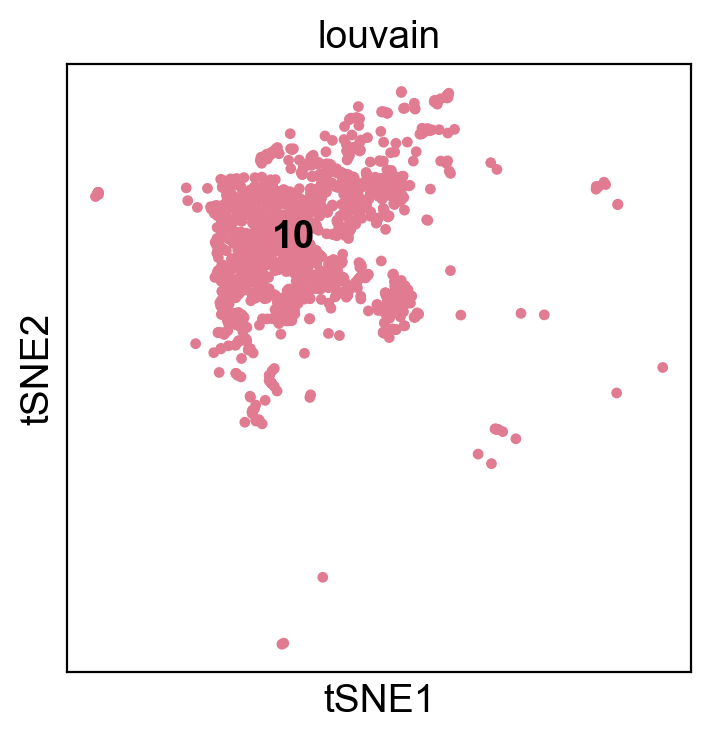

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(1999,)
Index(['AACCATGGTTCCGGCA-1_SIGAB1', 'AACTCAGGTGGGTCAA-1_SIGAB1',
       'AACTCCCGTCAAACTC-1_SIGAB1', 'AACTCCCGTGAAAGAG-1_SIGAB1',
       'AACTCTTCACTAAGTC-1_SIGAB1', 'AAGCCGCAGACAGGCT-1_SIGAB1',
       'ACACCAAGTAAAGGAG-1_SIGAB1', 'ACACCGGCAACGCACC-1_SIGAB1',
       'ACACTGAAGAAGGACA-1_SIGAB1', 'ACATACGTCCGGGTGT-1_SIGAB1',
       ...
       'TTGAACGTCGGAGCAA-1_SIGAH1', 'TTGCCGTCATCCCACT-1_SIGAH1',
       'TTGCGTCAGATATACG-1_SIGAH1', 'TTGCGTCCAAGTCATC-1_SIGAH1',
       'TTGGAACTCGTGGTCG-1_SIGAH1', 'TTGGCAAAGCGATTCT-1_SIGAH1',
       'TTTACTGAGAAGATTC-1_SIGAH1', 'TTTATGCAGAAGGTTT-1_SIGAH1',
       'TTTCCTCCAGATCCAT-1_SIGAH1', 'TTTGTCAAGCCCAGCT-1_SIGAH1'],
      dtype='object', length=1999)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


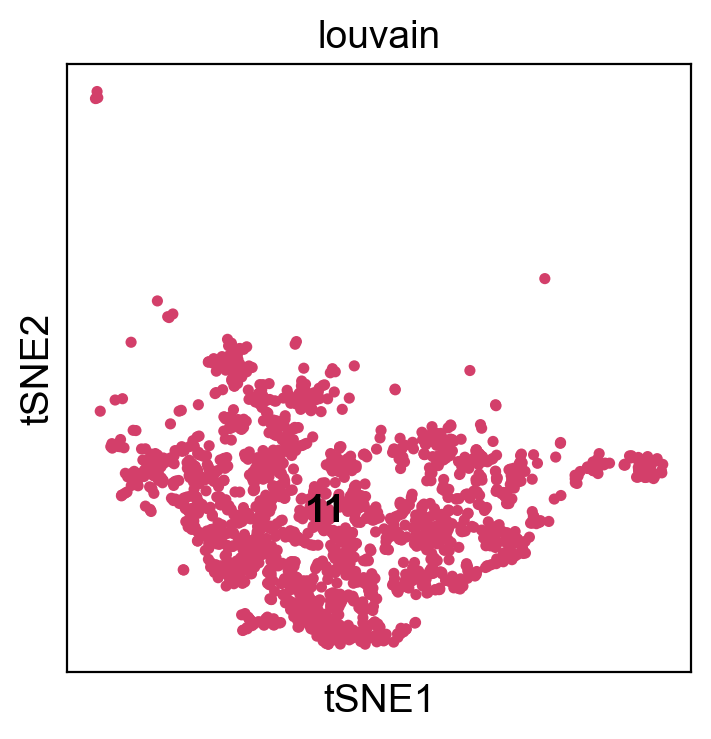

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(1857,)
Index(['AAACCTGAGGCTAGGT-1_SIGAB1', 'AAACCTGTCAGCATGT-1_SIGAB1',
       'AAACGGGAGGTCATCT-1_SIGAB1', 'AAAGCAATCTTGGGTA-1_SIGAB1',
       'AACACGTCATCACGTA-1_SIGAB1', 'AACCATGTCTAACCGA-1_SIGAB1',
       'AACCGCGGTTCGCTAA-1_SIGAB1', 'AACCGCGGTTGTCGCG-1_SIGAB1',
       'AACTCCCCATGCAATC-1_SIGAB1', 'AACTCTTTCGGCTACG-1_SIGAB1',
       ...
       'TTGCGTCCACATTCGA-1_SIGAH1', 'TTGGAACAGTGTCCAT-1_SIGAH1',
       'TTGTAGGGTCACCCAG-1_SIGAH1', 'TTTACTGAGACTAGAT-1_SIGAH1',
       'TTTACTGAGTCAAGCG-1_SIGAH1', 'TTTACTGAGTGTACCT-1_SIGAH1',
       'TTTACTGCAGTGGGAT-1_SIGAH1', 'TTTATGCTCGTGACAT-1_SIGAH1',
       'TTTCCTCGTATATGAG-1_SIGAH1', 'TTTGGTTTCTAGCACA-1_SIGAH1'],
      dtype='object', length=1857)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


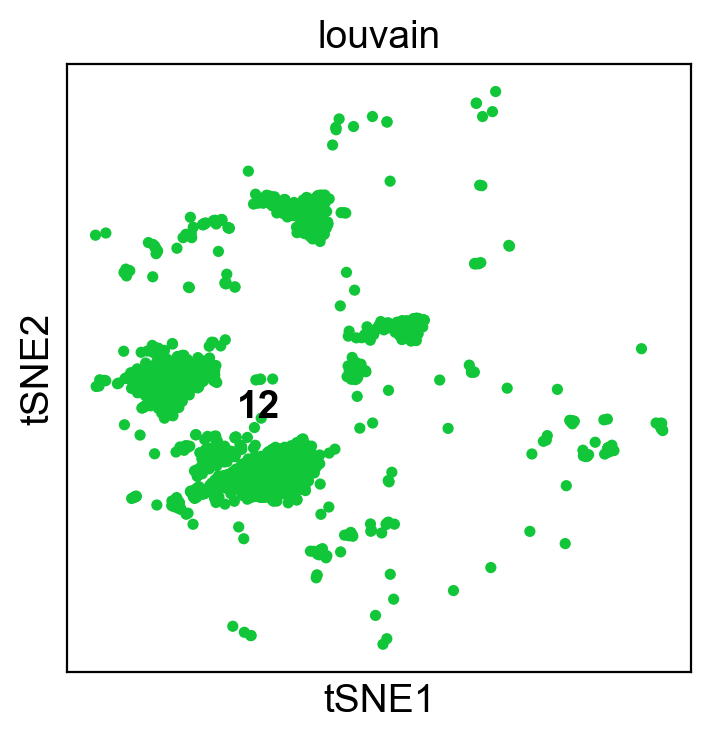

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(1844,)
Index(['AAAGATGTCGCATGGC-1_SIGAB1', 'AAAGTAGAGCAGACTG-1_SIGAB1',
       'AAAGTAGCACACTGCG-1_SIGAB1', 'AAAGTAGGTTGTCTTT-1_SIGAB1',
       'AAATGCCCAGTTCATG-1_SIGAB1', 'AACTCCCAGATAGGAG-1_SIGAB1',
       'AACTCCCAGTGGTAAT-1_SIGAB1', 'AACTCCCGTACCGAGA-1_SIGAB1',
       'AACTCCCTCGGATGTT-1_SIGAB1', 'AACTCCCTCTTCAACT-1_SIGAB1',
       ...
       'TTCGAAGAGTGGGTTG-1_SIGAH1', 'TTCTACACAAATACAG-1_SIGAH1',
       'TTCTCAATCGCCTGTT-1_SIGAH1', 'TTGCCGTAGAGGGATA-1_SIGAH1',
       'TTGCCGTGTATTCTCT-1_SIGAH1', 'TTGGAACAGATCCTGT-1_SIGAH1',
       'TTGGAACCACAAGTAA-1_SIGAH1', 'TTGGAACCATCTACGA-1_SIGAH1',
       'TTGGAACGTACAGCAG-1_SIGAH1', 'TTTGCGCTCTCGAGTA-1_SIGAH1'],
      dtype='object', length=1844)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


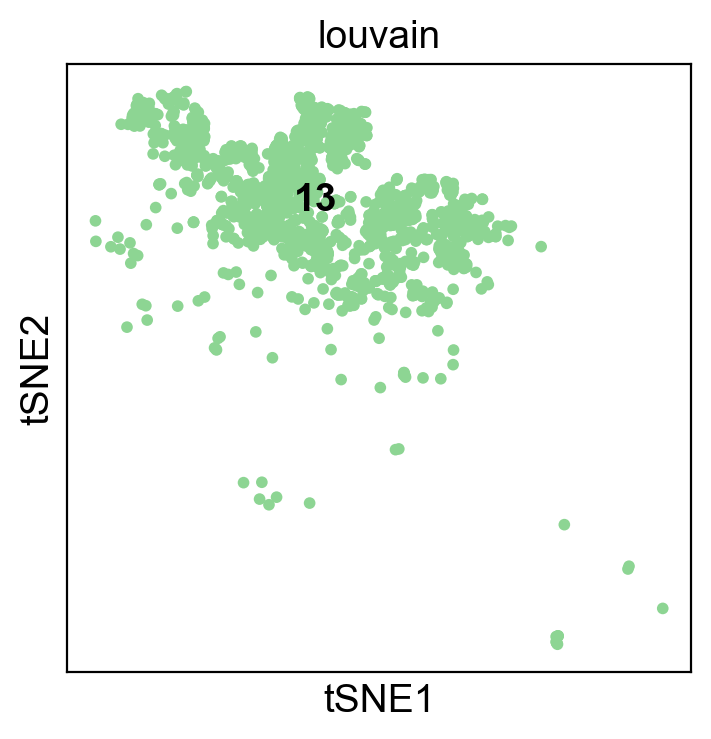

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(1703,)
Index(['AAACGGGAGTGCCATT-1_SIGAB1', 'AAAGATGAGGCACATG-1_SIGAB1',
       'AAAGTAGAGGCGCTCT-1_SIGAB1', 'AAAGTAGCACCCTATC-1_SIGAB1',
       'AACACGTAGGCAGTCA-1_SIGAB1', 'AACGTTGGTGAACCTT-1_SIGAB1',
       'AACGTTGTCACCTTAT-1_SIGAB1', 'AACTCTTTCTTGAGAC-1_SIGAB1',
       'AACTTTCCATGCAATC-1_SIGAB1', 'AAGCCGCTCTCGATGA-1_SIGAB1',
       ...
       'TGAGAGGCAGCATGAG-1_SIGAH1', 'TGCACCTGTAGAGTGC-1_SIGAH1',
       'TGCTACCGTGCAGACA-1_SIGAH1', 'TGGGCGTCACGTAAGG-1_SIGAH1',
       'TGGTTAGAGTTAACGA-1_SIGAH1', 'TGTGGTACATGTTCCC-1_SIGAH1',
       'TTAGGCAGTTCACCTC-1_SIGAH1', 'TTGGAACAGGAGTTTA-1_SIGAH1',
       'TTGGAACTCGGCCGAT-1_SIGAH1', 'TTTACTGCATCACAAC-1_SIGAH1'],
      dtype='object', length=1703)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


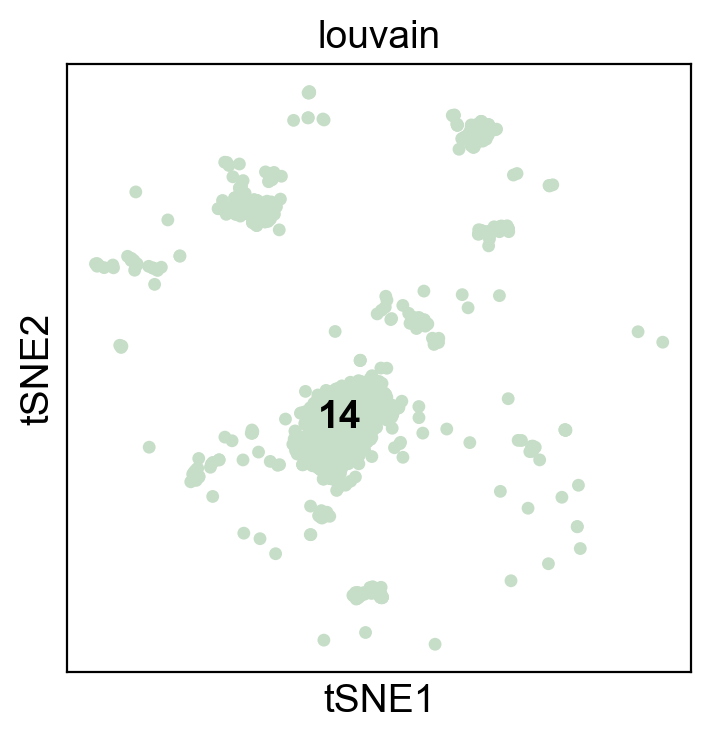

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(1407,)
Index(['AAACGGGAGTAATCCC-1_SIGAB1', 'AAACGGGCAGCTCGAC-1_SIGAB1',
       'AACTCAGTCAGCGACC-1_SIGAB1', 'AACTCAGTCCTGTACC-1_SIGAB1',
       'AAGCCGCAGTTAGCGG-1_SIGAB1', 'AAGCCGCTCGCCAAAT-1_SIGAB1',
       'AAGGCAGCAATCTACG-1_SIGAB1', 'AAGGCAGGTAACGCGA-1_SIGAB1',
       'AAGGCAGTCACTTATC-1_SIGAB1', 'AAGTCTGCATTACCTT-1_SIGAB1',
       ...
       'TGTGGTAAGCGTTGCC-1_SIGAH1', 'TGTTCCGAGCGTAATA-1_SIGAH1',
       'TTAGGCAAGCACCGTC-1_SIGAH1', 'TTAGGCAGTGTTCTTT-1_SIGAH1',
       'TTATGCTAGCGATAGC-1_SIGAH1', 'TTCCCAGAGCTTATCG-1_SIGAH1',
       'TTCGGTCAGAATGTGT-1_SIGAH1', 'TTCTCAACATGCCTAA-1_SIGAH1',
       'TTGGAACAGGACAGCT-1_SIGAH1', 'TTTGTCAGTCAGCTAT-1_SIGAH1'],
      dtype='object', length=1407)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


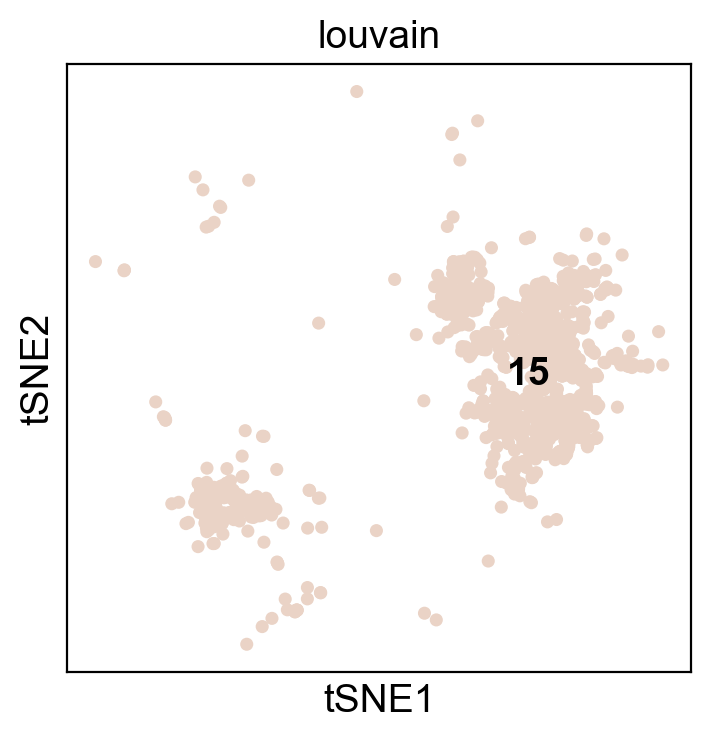

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(1354,)
Index(['AAACCTGAGATATACG-1_SIGAB1', 'AAACCTGAGGCAGGTT-1_SIGAB1',
       'AAACCTGCAATGACCT-1_SIGAB1', 'AAACCTGCATCGATTG-1_SIGAB1',
       'AAACGGGTCGGCGCAT-1_SIGAB1', 'AAAGCAACAATGGAGC-1_SIGAB1',
       'AAAGCAATCTGCTGTC-1_SIGAB1', 'AAATGCCCACCGCTAG-1_SIGAB1',
       'AACACGTAGAATGTTG-1_SIGAB1', 'AACACGTAGAATTGTG-1_SIGAB1',
       ...
       'CTCTGGTCAAAGTGCG-1_SIGAH1', 'CTCTGGTCAGCTTAAC-1_SIGAH1',
       'GACTACAAGACTACAA-1_SIGAH1', 'GCTTCCAAGCTGATAA-1_SIGAH1',
       'GGATTACAGATGGCGT-1_SIGAH1', 'GGCCGATTCACCCGAG-1_SIGAH1',
       'GTTACAGGTGCCTGTG-1_SIGAH1', 'TCGCGAGGTTATCCGA-1_SIGAH1',
       'TTGCGTCTCTTTAGTC-1_SIGAH1', 'TTTCCTCGTCTCTTTA-1_SIGAH1'],
      dtype='object', length=1354)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


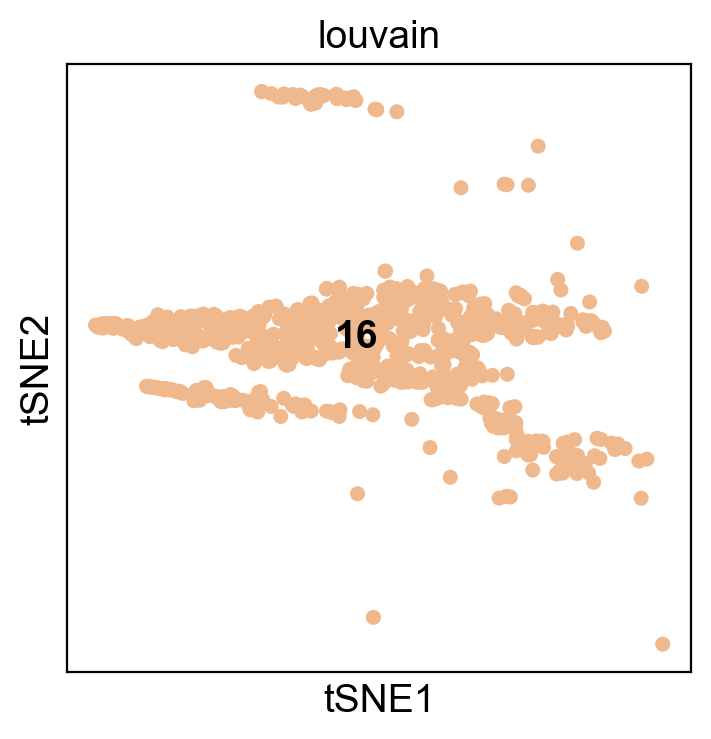

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(1023,)
Index(['AACCATGCACTAAGTC-1_SIGAB1', 'ACCTTTATCACATACG-1_SIGAB1',
       'AGTTGGTCATCACGTA-1_SIGAB1', 'CACACAAAGGCTATCT-1_SIGAB1',
       'CACCACTAGGCCCTCA-1_SIGAB1', 'CATCGAAAGGTGATAT-1_SIGAB1',
       'CCGTTCAAGGACATTA-1_SIGAB1', 'CCTTCCCCACAGGAGT-1_SIGAB1',
       'CCTTCCCGTCGTTGTA-1_SIGAB1', 'CGAGCACAGATGGCGT-1_SIGAB1',
       ...
       'TTGCCGTTCAACTCTT-1_SIGAH1', 'TTGCGTCGTACAGTGG-1_SIGAH1',
       'TTGGCAAAGAGTACAT-1_SIGAH1', 'TTGGCAACAGACTCGC-1_SIGAH1',
       'TTTACTGAGGCACATG-1_SIGAH1', 'TTTACTGTCACCCTCA-1_SIGAH1',
       'TTTCCTCGTGCATCTA-1_SIGAH1', 'TTTGCGCTCTTGTACT-1_SIGAH1',
       'TTTGGTTGTCTCCACT-1_SIGAH1', 'TTTGTCAAGAGTAAGG-1_SIGAH1'],
      dtype='object', length=1023)
(44802, 2799

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


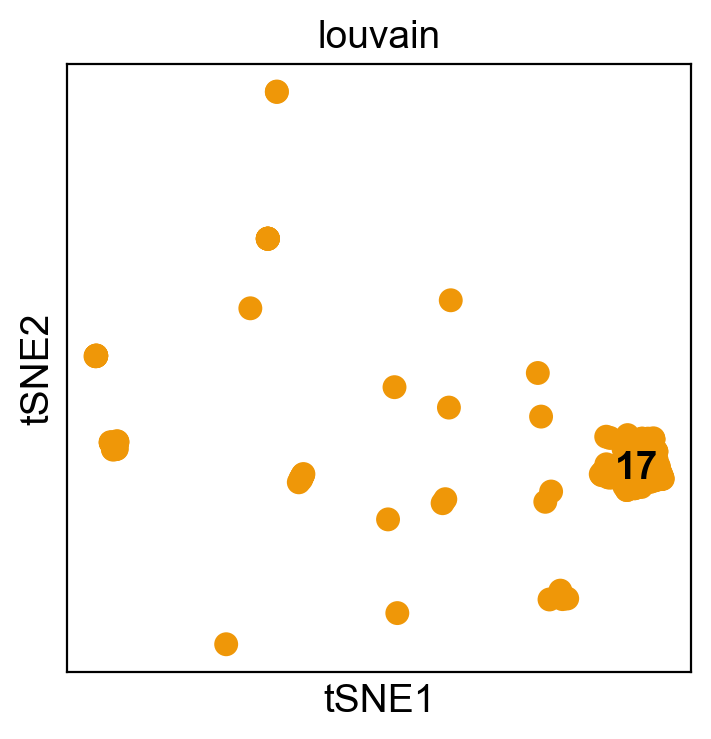

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(405,)
Index(['AACACGTGTTAAGACA-1_SIGAB1', 'AACTCTTAGGGTCTCC-1_SIGAB1',
       'AACTCTTTCGTTACAG-1_SIGAB1', 'ACAGCCGCATGGTAGG-1_SIGAB1',
       'ACCGTAAAGCGTCTAT-1_SIGAB1', 'ACCGTAAAGTTACCCA-1_SIGAB1',
       'ACGGCCATCTCTGCTG-1_SIGAB1', 'ACGGGCTCAGTCTTCC-1_SIGAB1',
       'ACTGAGTCAATCTACG-1_SIGAB1', 'ACTGATGGTCCATGAT-1_SIGAB1',
       ...
       'GGTGAAGGTATAGGGC-1_SIGAH1', 'GTACGTATCAATAAGG-1_SIGAH1',
       'GTAGTCATCGCCTGTT-1_SIGAH1', 'GTGCGGTTCTAACTGG-1_SIGAH1',
       'GTGCTTCCAAGGTGTG-1_SIGAH1', 'TACAGTGCAAGTCTAC-1_SIGAH1',
       'TACTCATTCGTCGTTC-1_SIGAH1', 'TGGTTCCTCAATCACG-1_SIGAH1',
       'TGTCCCATCTAACTCT-1_SIGAH1', 'TTGGAACCATGGTCAT-1_SIGAH1'],
      dtype='object', length=405)
(44802, 27998)

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


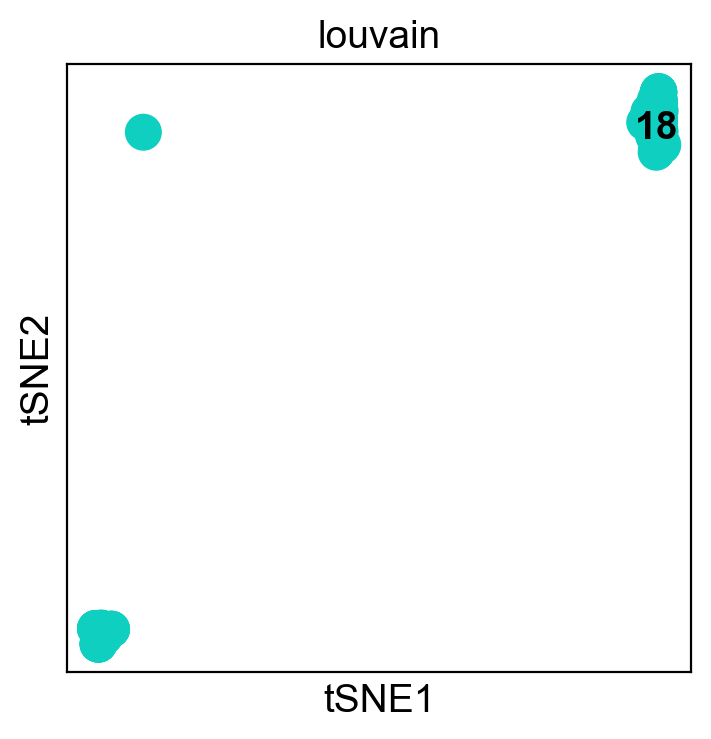

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(169,)
Index(['AAACCTGCACCACGTG-1_SIGAB1', 'AATCCAGCAGGCTCAC-1_SIGAB1',
       'ACATCAGTCTCTAGGA-1_SIGAB1', 'ACTTGTTCATCGGAAG-1_SIGAB1',
       'AGATTGCGTTGACGTT-1_SIGAB1', 'AGCTCCTTCCCTTGTG-1_SIGAB1',
       'AGTAGTCAGCTGCAAG-1_SIGAB1', 'ATCATGGTCACGAAGG-1_SIGAB1',
       'ATCTGCCGTTTCGCTC-1_SIGAB1', 'ATGGGAGGTCTCTCGT-1_SIGAB1',
       ...
       'GATCGATGTAGCGTCC-1_SIGAH1', 'GCATGATCACAGGAGT-1_SIGAH1',
       'GCATGTATCACCCGAG-1_SIGAH1', 'GGACATTAGACAGGCT-1_SIGAH1',
       'GTGTGCGCATGGTCTA-1_SIGAH1', 'GTTAAGCTCTGTCTCG-1_SIGAH1',
       'TAGCCGGTCCCGGATG-1_SIGAH1', 'TCAGCTCCAATGACCT-1_SIGAH1',
       'TGAGCATCACACCGCA-1_SIGAH1', 'TGTATTCGTTAGGGTG-1_SIGAH1'],
      dtype='object', length=169)
(44802, 27998)

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


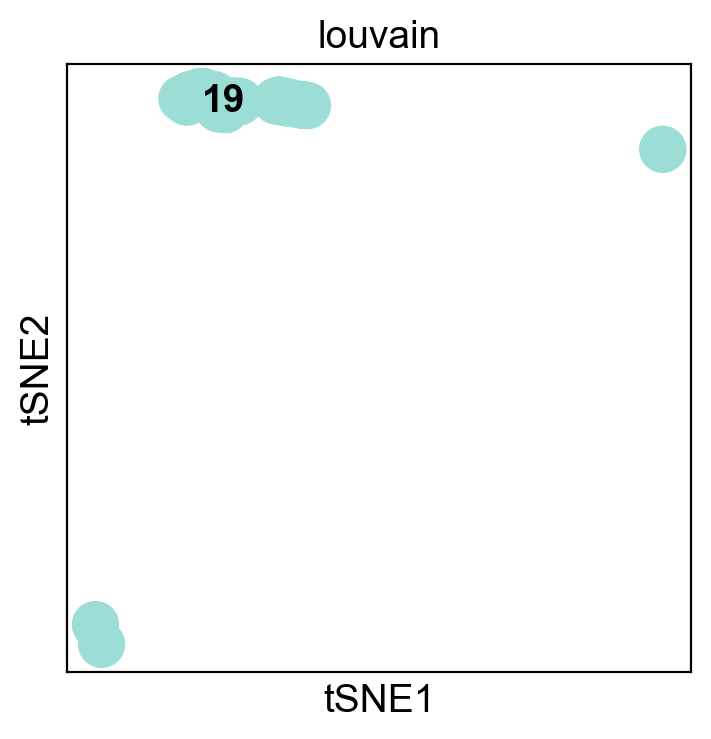

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(103,)
Index(['ACAGCCGAGTGTACGG-1_SIGAB1', 'ACCTTTACAGACGCAA-1_SIGAB1',
       'ACGAGGACAATACGCT-1_SIGAB1', 'ACTATCTGTATTAGCC-1_SIGAB1',
       'ACTGAACGTCCGACGT-1_SIGAB1', 'CCCATACCAGCCAGAA-1_SIGAB1',
       'CCGGTAGAGGACCACA-1_SIGAB1', 'CCTTACGGTGAGTATA-1_SIGAB1',
       'CCTTTCTGTCAACATC-1_SIGAB1', 'CTAACTTCAGGTTTCA-1_SIGAB1',
       ...
       'CATTCGCAGTTCCACA-1_SIGAH1', 'CATTCGCCAGATGAGC-1_SIGAH1',
       'CGTTGGGCACTGCCAG-1_SIGAH1', 'CTCTAATCAGCTGCTG-1_SIGAH1',
       'GACGCGTTCTTGTCAT-1_SIGAH1', 'GATCTAGAGTCACGCC-1_SIGAH1',
       'GGGCACTGTCAGATAA-1_SIGAH1', 'TCAGCAATCAGGTAAA-1_SIGAH1',
       'TCGCGTTAGGGAGTAA-1_SIGAH1', 'TGCGTGGGTAACGTTC-1_SIGAH1'],
      dtype='object', length=103)
(44802, 27998)

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


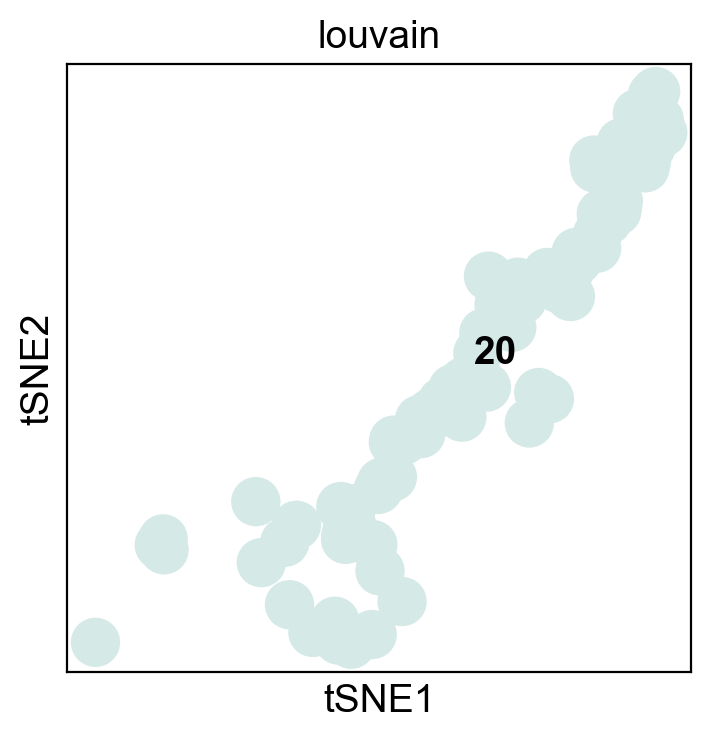

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(95,)
Index(['AAGACCTCACCAACCG-1_SIGAB1', 'ACAGCCGTCTAGAGTC-1_SIGAB1',
       'ACGGGCTTCGTCACGG-1_SIGAB1', 'AGCGGTCCAGGACGTA-1_SIGAB1',
       'AGGGAGTAGTTCCACA-1_SIGAB1', 'AGGGATGTCTCTAAGG-1_SIGAB1',
       'AGTGAGGGTTCAACCA-1_SIGAB1', 'ATCACGAAGAGGTACC-1_SIGAB1',
       'ATCATCTAGTGTCCCG-1_SIGAB1', 'ATGGGAGGTGGTGTAG-1_SIGAB1',
       'CATCGAATCTGACCTC-1_SIGAB1', 'CCCAGTTGTAGCGATG-1_SIGAB1',
       'CCCTCCTCATCAGTAC-1_SIGAB1', 'CCGTGGAAGTCCATAC-1_SIGAB1',
       'CGGAGTCTCTTCTGGC-1_SIGAB1', 'CGTAGCGCACTATCTT-1_SIGAB1',
       'CGTCACTCAGTAGAGC-1_SIGAB1', 'GACAGAGCAGTGACAG-1_SIGAB1',
       'GCAATCACAAGGGTCA-1_SIGAB1', 'GCGCCAAGTTGAGTTC-1_SIGAB1',
       'GGACAGAGTAGCGTAG-1_SIGAB1', 'GTATCTTCACATGGGA-1_SIGAB

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


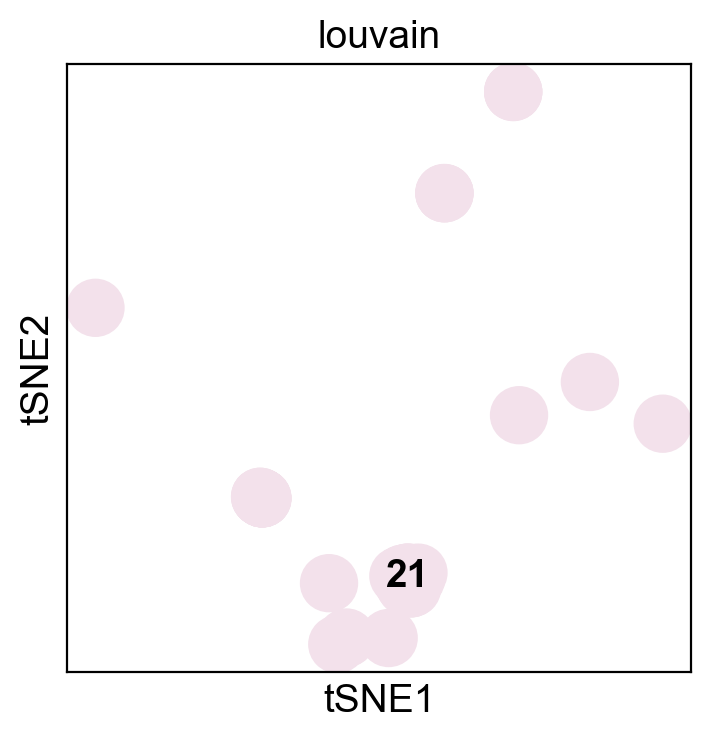

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(68,)
Index(['AAGCCGCTCAGCATGT-1_SIGAB1', 'ATCCGAATCTTATCTG-1_SIGAB1',
       'CCAGCGAAGGCGCTCT-1_SIGAB1', 'CCCAATCGTATTAGCC-1_SIGAB1',
       'CGAGCACCACCGGAAA-1_SIGAB1', 'CGATGGCCAGCCAGAA-1_SIGAB1',
       'GACGGCTTCAACGAAA-1_SIGAB1', 'GGCTGGTAGCTAGTTC-1_SIGAB1',
       'GGGCACTCATCGGGTC-1_SIGAB1', 'GGTATTGAGTACACCT-1_SIGAB1',
       'GTACGTAAGACCCACC-1_SIGAB1', 'GTACTCCCAATGACCT-1_SIGAB1',
       'TATCAGGAGCCTATGT-1_SIGAB1', 'TGTTCCGTCATGTGGT-1_SIGAB1',
       'TTTGCGCCAGGGATTG-1_SIGAB1', 'ACGCCAGGTCGAAAGC-1_SIGAC1',
       'ATAGACCTCTCCGGTT-1_SIGAC1', 'CAGATCAGTCGGATCC-1_SIGAC1',
       'CATCCACTCGTGGTCG-1_SIGAC1', 'CATTATCAGCGGCTTC-1_SIGAC1',
       'CTCGAAACAATAGCGG-1_SIGAC1', 'CTCTGGTAGGATCGCA-1_SIGAC

c:\users\seyed_000\appdata\local\programs\python\python38\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


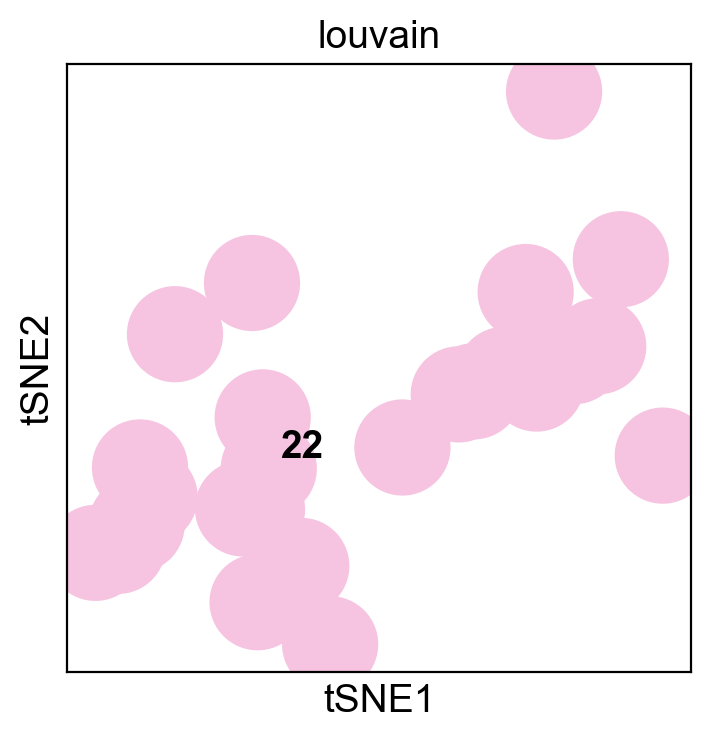

(4665,)
Index(['Rb1cc1', '4732440D04Rik', 'Pcmtd1', 'Gm26901', 'Vcpip1', 'Sgk3',
       'Cspp1', 'Prex2', 'Eya1', 'Sbspon',
       ...
       'Sfxn4', 'Grk5', 'Zfp950', 'Csf2ra', 'mt-Co1', 'mt-Atp6', 'mt-Co3',
       'mt-Nd4l', 'mt-Cytb', 'PISD'],
      dtype='object', length=4665)
(25,)
Index(['ACACTGAAGGTAAACT-1_SIGAD1', 'AAGGAGCCAAAGCAAT-1_SIGAF1',
       'CACAGGCTCTCCGGTT-1_SIGAF1', 'CAGCCGAGTATCGCAT-1_SIGAF1',
       'CTTGGCTAGAAGGGTA-1_SIGAF1', 'GTGTGCGCATCGATTG-1_SIGAF1',
       'TAGTTGGCATTCTCAT-1_SIGAF1', 'TATCTCATCCTCCTAG-1_SIGAF1',
       'TGAGCATGTCGCATAT-1_SIGAF1', 'AACTTTCGTGTTTGGT-1_SIGAG1',
       'AATCCAGCACCTTGTC-1_SIGAG1', 'AATCCAGGTCAGTGGA-1_SIGAG1',
       'ACCGTAAGTGAAATCA-1_SIGAG1', 'ACGGGTCCACGCTTTC-1_SIGAG1',
       'ATCACGATCTGTCAAG-1_SIGAG1', 'CATGCCTCAATAAGCA-1_SIGAG1',
       'AAAGATGCAGCCACCA-1_SIGAH1', 'AGGGAGTGTGTAATGA-1_SIGAH1',
       'ATAAGAGGTGAAGGCT-1_SIGAH1', 'ATGGGAGCATAGACTC-1_SIGAH1',
       'CGTCTACCAGACGCCT-1_SIGAH1', 'TCTGGAAGTCAGTGGA-1_SIGAH

In [30]:
# Loop through each cluster
for cluster_id in range(23):
    # Filter cells of interest based on cluster
    cell_of_interest = adata.obs.index[adata.obs.louvain == str(cluster_id)]
    adata_subcluster = adata[cell_of_interest, :]

    # Perform t-SNE visualization
    sc.pl.tsne(adata_subcluster, color=['louvain'], legend_loc='on data')

    # Print var_names shape and values
    print(adata_subcluster.var_names.shape)
    print(adata_subcluster.var_names)

    # Print obs_names shape and values
    print(adata_subcluster.obs_names.shape)
    print(adata_subcluster.obs_names)

    # Access the raw count matrix
    raw_counts = adata.raw.X

    # Print raw count matrix shape and var/obs names
    print(raw_counts.shape)
    print(adata.raw.var_names)
    print(adata.raw.obs_names)

    # Convert raw count matrix to a dense array
    dense_array = raw_counts.toarray()

    # Create a pandas DataFrame using the dense array
    df_raw_counts = pd.DataFrame(
        data=dense_array,
        index=adata.raw.obs_names,
        columns=adata.raw.var_names
    )

    # Find common observations
    common_obs = list(set(adata_subcluster.obs_names) & set(df_raw_counts.index))

    # Extract the subset of rows
    subset_raw_counts = df_raw_counts.loc[common_obs, :]

    # Print the subset of rows and save to a CSV file
    print(subset_raw_counts)
    subset_raw_counts.to_csv(f'./write_fig3/subset_counts_cluster_{cluster_id}.csv')